<a href="https://colab.research.google.com/github/anadiedrichs/2023-vision-computacional/blob/main/TP1_Diedrichs_vision_computacional.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabajo práctico 1 - visión computacional

Ana Laura Diedrichs

Legajo SIU a0902

Cohorte 9Co2022

# Parte 1 (imágenes en /white_patch y /coord_cromaticas):



## 1. Implementar el algoritmo de pasaje a coordenadas cromáticas para librarnos de las variaciones de contraste.

In [36]:
#Si queremos que las imágenes sean mostradas en una ventana emergente quitar el inline
%matplotlib inline
#%matplotlib qt
# OpenCV-Python utiliza NumPy para el manejo de imágenes
import numpy as np
# cv2 es el módulo python para acceder a OpenCV
import cv2 as cv
# Usamos las poderosas herramientas de graficación de matplotlib para mostrar imágenes, perfiles, histogramas, etc
import matplotlib.pyplot as plt
# para importar imagenes desde urls
from skimage import io
# mostrar imagenes opencv en googlecolab
from google.colab.patches import cv2_imshow

In [32]:
url = 'https://www.dropbox.com/s/8efkws4d0amkrgo/CoordCrom_1.png?dl=1'
#url = 'https://www.dropbox.com/s/8efkws4d0amkrgo/CoordCrom_2.png?dl=1'
#url = 'https://www.dropbox.com/s/8efkws4d0amkrgo/CoordCrom_3.png?dl=1'
myImg = io.imread(url)
image = cv.cvtColor(myImg, cv.COLOR_BGR2RGB)
#cv2_imshow(image) # descomentar para visualizar la imagen descargada

El pasaje a coordenadas cromáticas es modificar el contraste, es decir, multiplicar mi imagen por un valor.

$$ s (R,G,B) =  (\frac{sR}{sR+sG+sB},\frac{sG}{sR+sG+sB},\frac{sB}{sR+sG+sB} ) $$

In [33]:
def coord_cromaticas( image,scale_factor = 0.7):
  # Quiero desensamblar los canales para trabajarlos por separado
  im_r, im_g, im_b = cv.split(image)
  # DUDA scale_factor debe ser estar limitado a un rango de valores?
  # TODO

  denominador = im_r + im_g + im_b

  # evitamos que el denominador quede en cero para evitar exception por division x cero
  denominador[denominador == 0] = 1

  for i in range(3):
    image[:,:,i] = scale_factor  * ( image[:,:,i] / denominador)

  img2 = np.int8(image)
  return img2

A continuación pruebo para distintos valores de *s*:

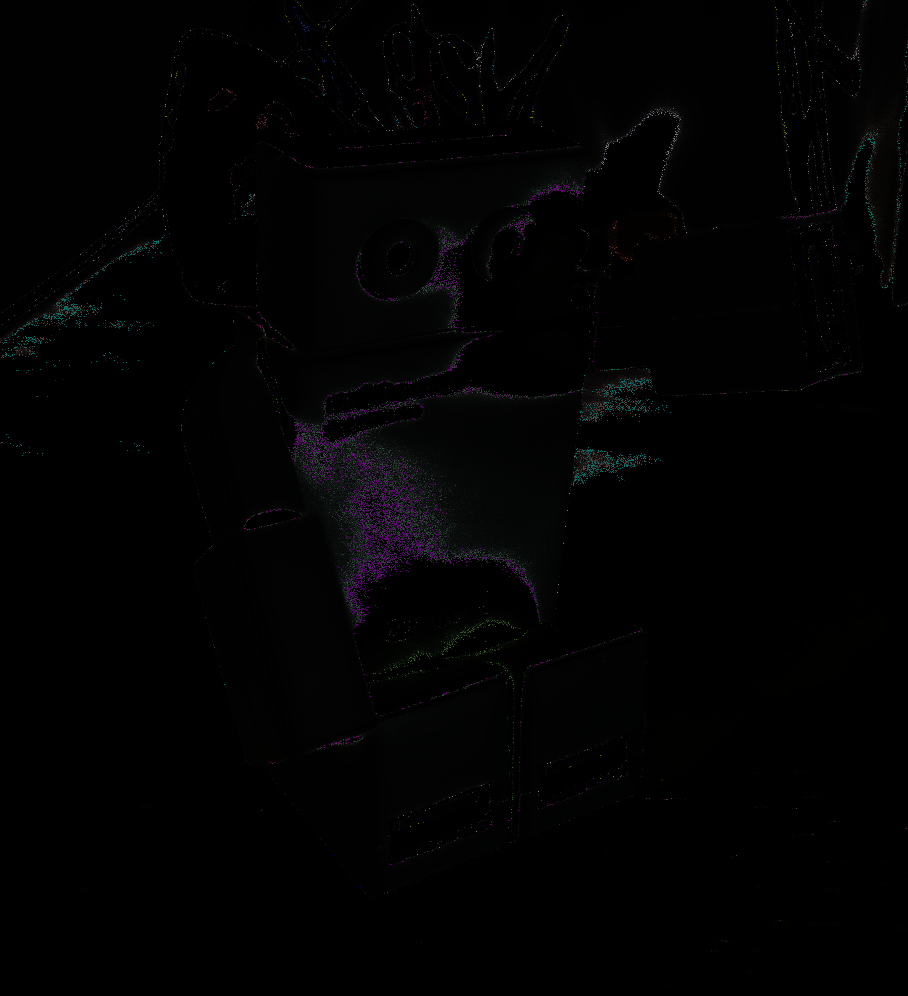

In [34]:
cv2_imshow(coord_cromaticas(image.copy()))

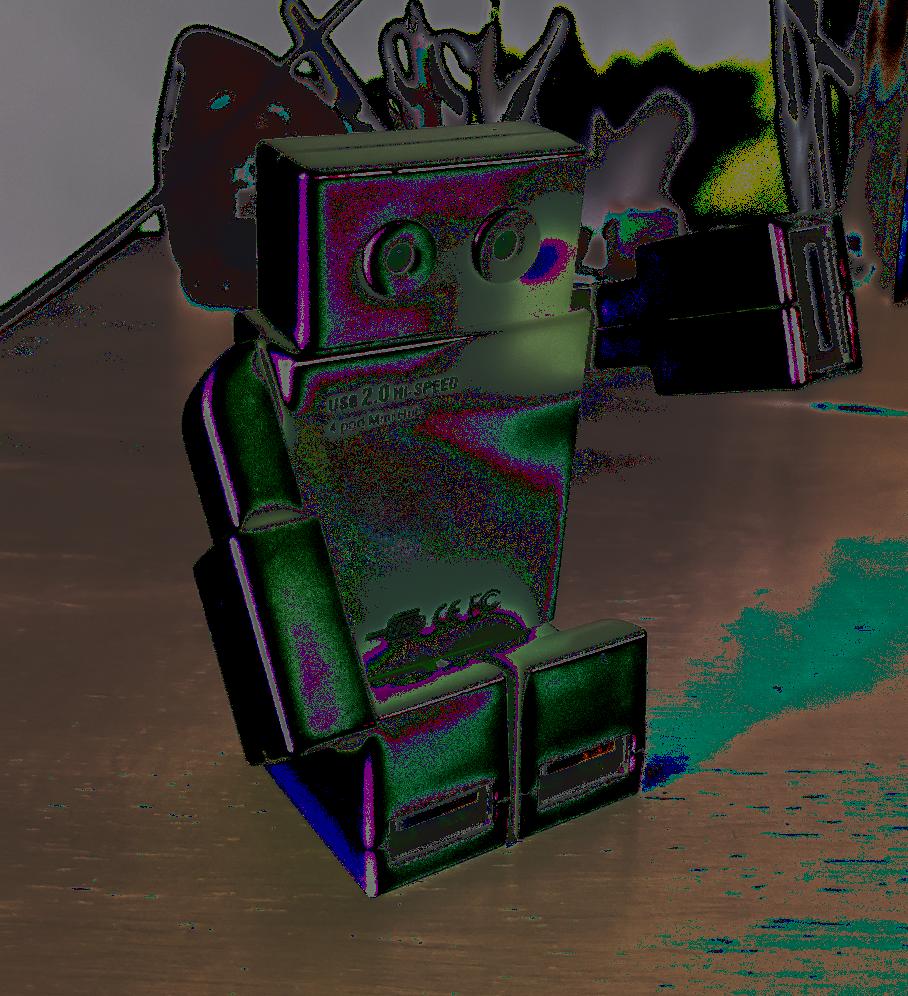

In [35]:
cv2_imshow(coord_cromaticas(image.copy(),72))


## 2. Implementar el algoritmo White Patch para librarnos de las diferencias de color de iluminación.


El algoritmo White Patch toma una imagen *I* con sus canales R,G,B para transformarla como indica la siguiente fórmula:

$$ I(R,G,B) =>  [\frac{255}{r_{max}}R,\frac{255}{g_{max}}G,\frac{255}{b_{max}}B ] $$

Siendo $r_{max}$ el valor máximo del canal R (rojo), $g_{max}$ el máximo valor del canal G (verde) y $b_{max}$ el valor máximo del canal B o azul.

In [37]:
def white_patch(imagen):
  # Quiero desensamblar los canales para trabajarlos por separado
  im_r, im_g, im_b = cv.split(imagen)
  for i in range(3):
    imagen[:,:,i] = float(255)/np.max(imagen[:,:,i])  *  imagen[:,:,i]

#  img2 = np.int8(imagen)
#  return img2
  return imagen

## 3. Mostrar los resultados obtenidos y analizar las posibles fallas (si es que las hay) en el caso de White patch.


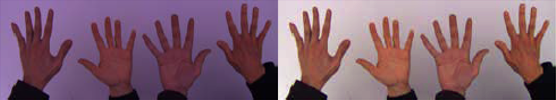

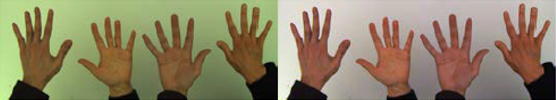

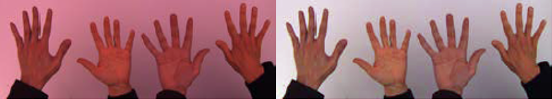

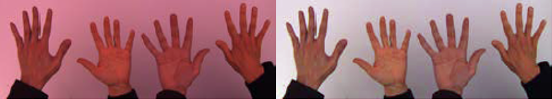

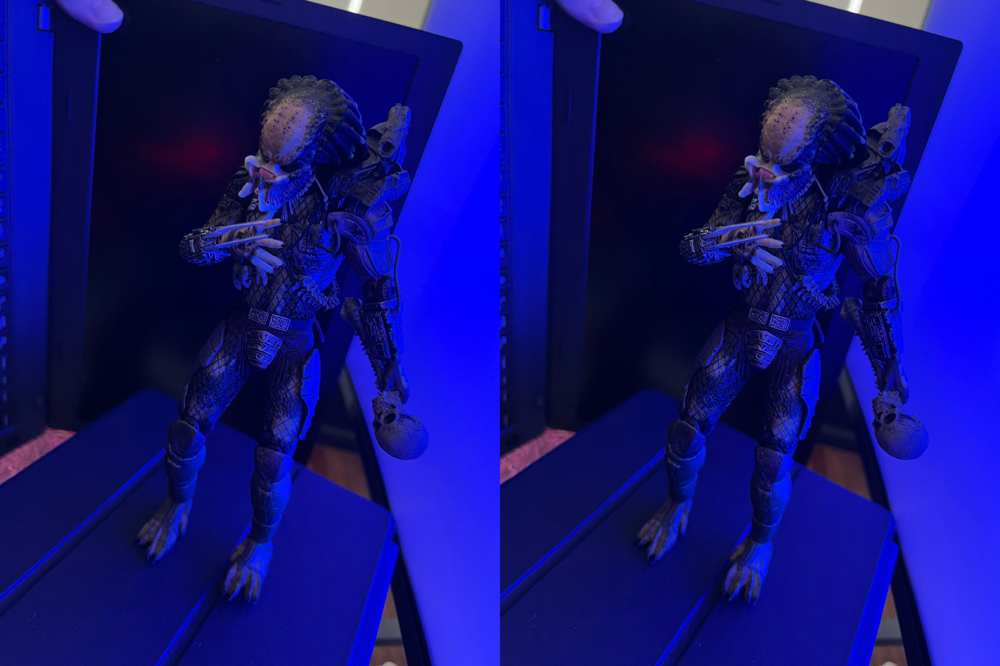

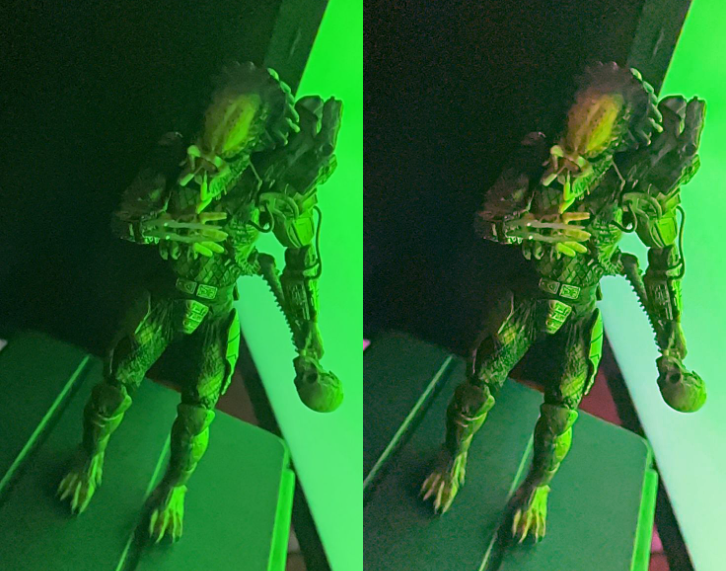

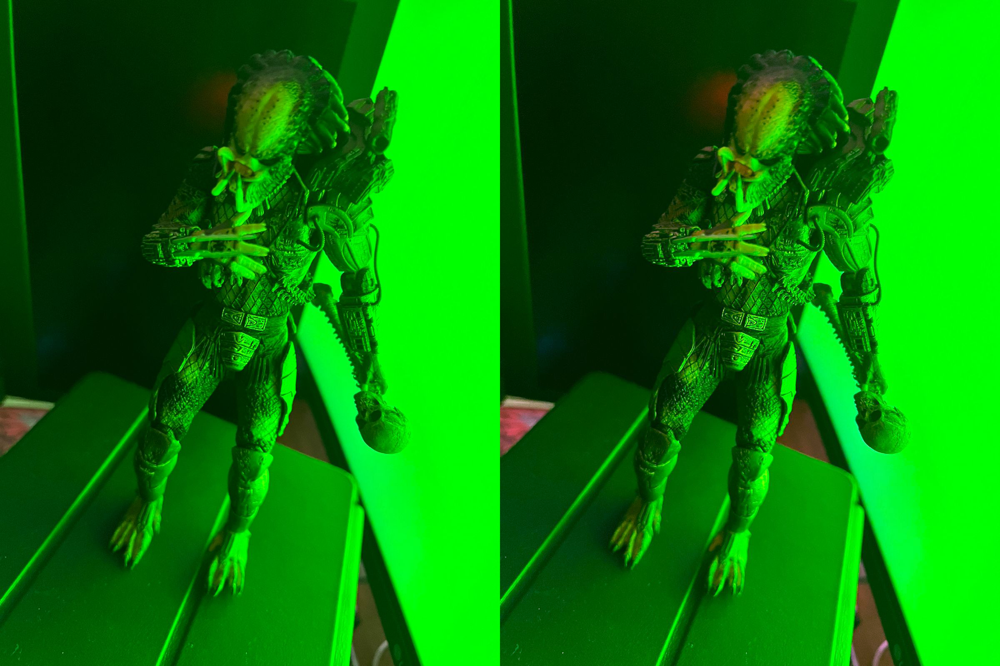

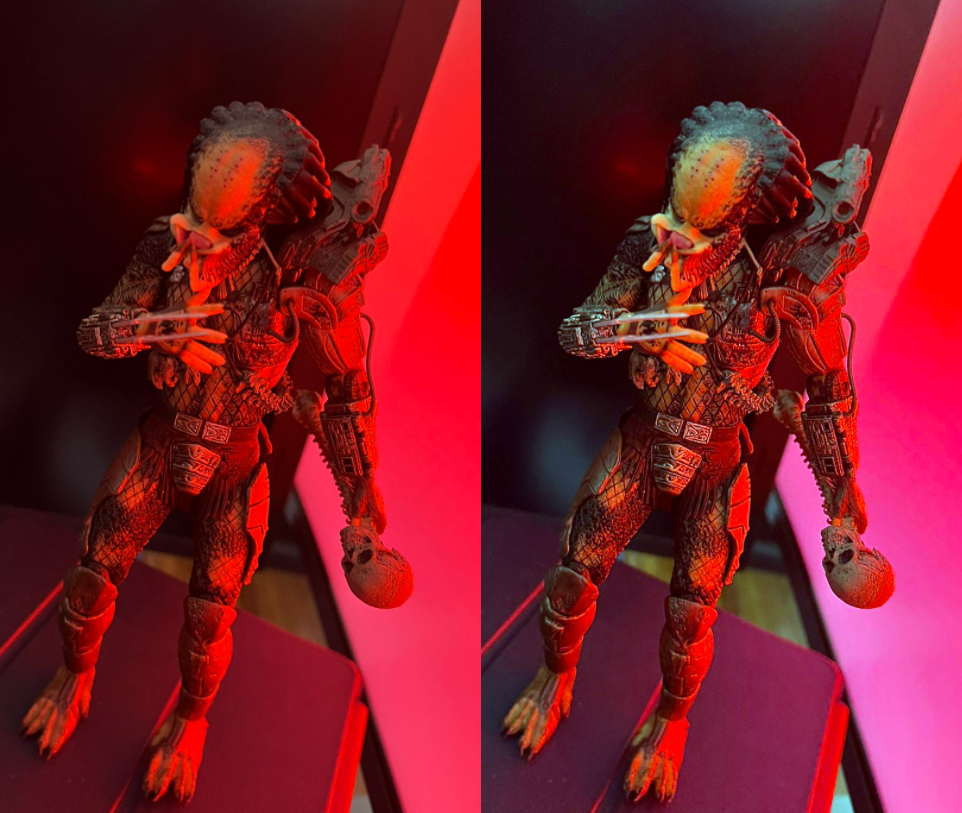

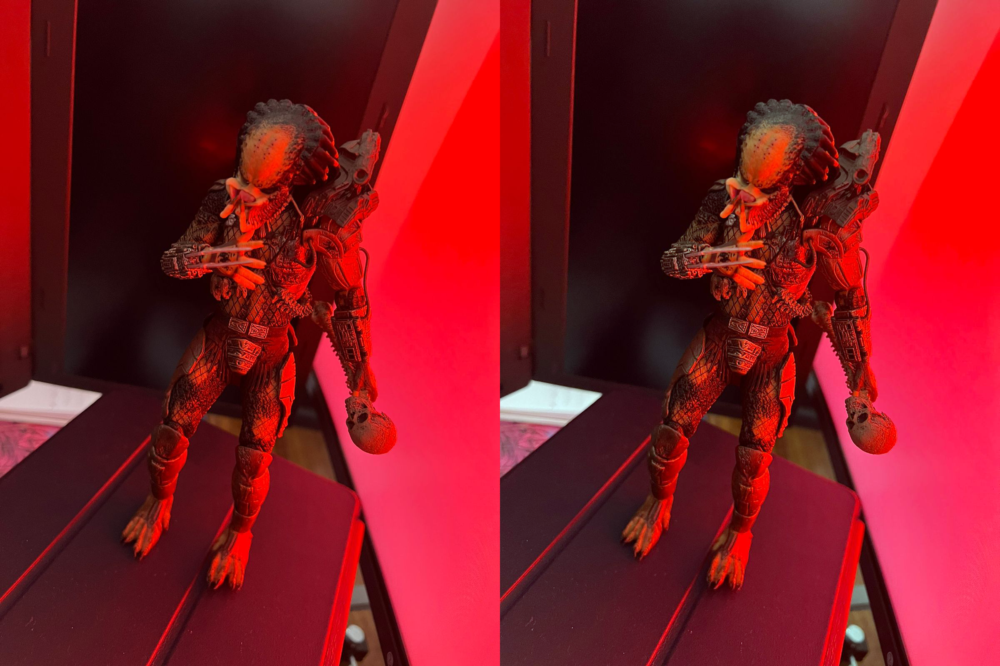

In [38]:
urls = ["https://www.dropbox.com/s/horjm002oqf685i/test_blue.png?dl=1",
      "https://www.dropbox.com/s/830ejumhb12qwr1/test_green.png?dl=1",
      "https://www.dropbox.com/s/bxv1wsxbu8iwhy7/test_red.png?dl=1",
      "https://www.dropbox.com/s/bxv1wsxbu8iwhy7/test_red.png?dl=1",
      "https://www.dropbox.com/s/m9bripcj8w27vq1/wp_blue.jpg?dl=1",
      "https://www.dropbox.com/s/8cthn5kyr9wg80v/wp_green.png?dl=1",
      "https://www.dropbox.com/s/fraj46ytuauxgvw/wp_green2.jpg?dl=1",
      "https://www.dropbox.com/s/ht0l38by77bw8fd/wp_red.png?dl=1",
      "https://www.dropbox.com/s/jrk1nb7ba2me51x/wp_red2.jpg?dl=1"]


for url in urls:
  image = io.imread(url)
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image_2, white_patch(image_2.copy())))
  cv2_imshow(final_frame)
  print('\n')



Una desventaja es que toma el máximo absoluto de cada canal y si tenemos un sólo píxel saturado (cuando su valor es 255), pues 255/255 da 1 y regresaría los mismos valores de la imagen original para ese canal.


Una mejora al white_patch es usar un percentil en vez del valor máximo 255.

# Parte 2:
## 1. Para las imágenes img1_tp.png y img2_tp.png leerlas con OpenCV en escala de grises y visualizarlas.


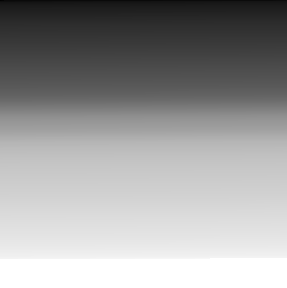

In [39]:
url1 = "https://www.dropbox.com/s/d9k8a1qs3lyq7yt/img1_tp.png?dl=1"
img1 = io.imread(url1)
image1 = cv.cvtColor(img1, cv.IMREAD_GRAYSCALE)
cv2_imshow( image1)


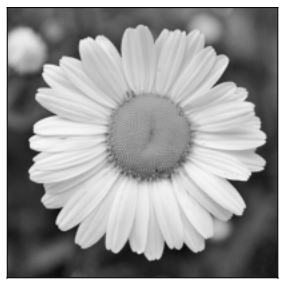

In [40]:
url2 = "https://www.dropbox.com/s/5uld2xlc4jt274m/img2_tp.png?dl=1"
img2 = io.imread(url2)

image2 = cv.cvtColor(img2, cv.IMREAD_GRAYSCALE)

cv2_imshow( image2)


## 2. Elija el numero de bins que crea conveniente y grafique su histograma, compare los histogramas entre si. Explicar lo que se observa, si tuviera que entrenar un modelo de clasificación/detección de imágenes, ¿considera que puede ser de utilidad tomar como ‘features’ a los histogramas?


Elijo un bin por cada color, ya que en RGB son 255 colores. Abajo observamos el gráfico de ambos histogramas.

In [41]:
# image.ravel() es como un flatten

hist1, bins1 = np.histogram(image1.ravel(), bins=256, range=[0, 256])
hist2, bins2 = np.histogram(image2.ravel(), bins=256, range=[0, 256])


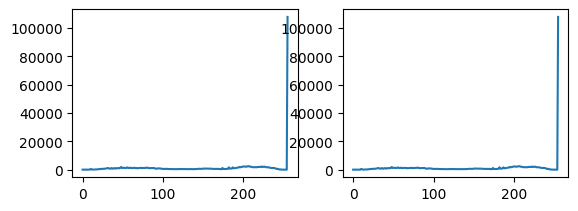

In [42]:
# Nueva figura
fig = plt.figure()

# Histogramas de la imagen
plt.subplot(221), plt.plot(hist1)
plt.subplot(222), plt.plot(hist2)
plt.show()

Se ven muy similares los gráficos anteriores.

Observamos los datos de los valores de los histogramas como tabla interactiva a través del tipo de dato DataFrame de la librería pandas.

In [43]:
import pandas as pd

In [44]:
df = pd.DataFrame({'hist1':hist1,'hist2': hist2})
df

,hist1,hist2
0,0,0
1,0,0
2,3,3
3,3,3
4,6,6
...,...,...
251,0,0
252,0,0
253,0,0
254,0,0


Aparentemente los valores de ambos histogramas son iguales.

In [45]:
df[df['hist1']!=df['hist2']]

,hist1,hist2


Con el filtro o consulta anterior termino de confirmar que tanto el primer histograma (hist1) como el segundo son iguales.

Si bien las imágenes lucen diferentes, su distribución de colores (tonos de gris) es la misma, por ello sus histogramas son iguales. Por lo tanto no podemos fiarnos de los histogramas para tareas como clasificación de imágenes.

## 3. Para la imagen segmentacion.png analice el histograma de los canales RGB. Segmente algunos de los elementos presentes en la imagen (agua, cielo, tierra) y muestre, aplicando máscaras, las regiones en imágenes separadas.

Cargo y visualizo la imagen segmentacion.png

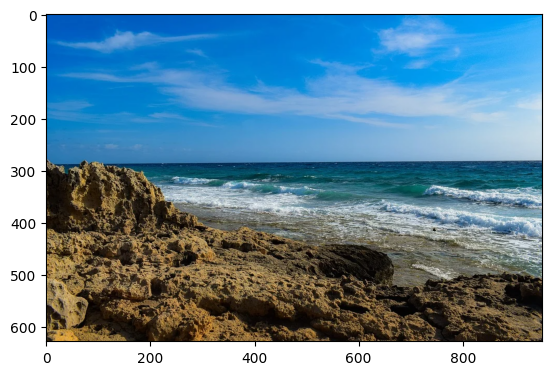

In [50]:
# Cargar la imagen
url3 = "https://www.dropbox.com/s/oa6g87a3v7krtbh/segmentacion.png?dl=1"
img3 = io.imread(url3)

#img = cv.cvtColor(img3, cv.COLOR_BGR2RGB)

plt.figure(1)
plt.imshow(img3)
plt.show()

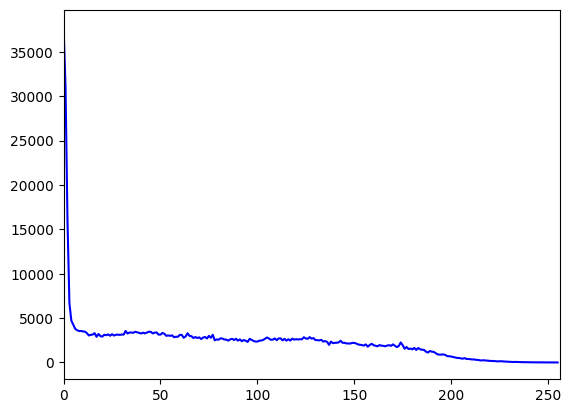

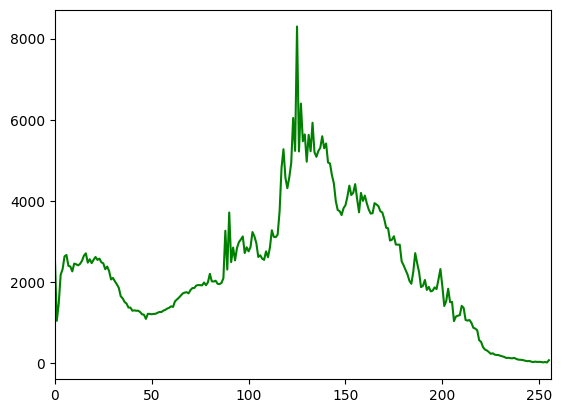

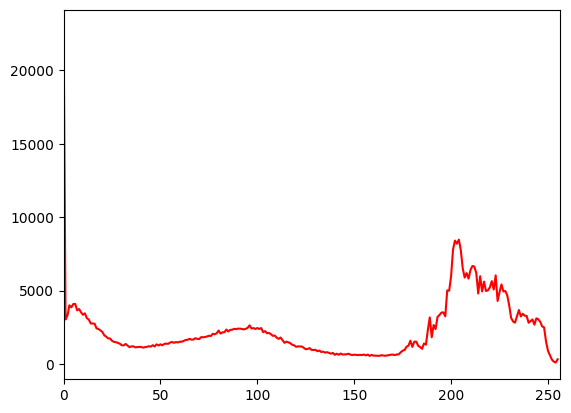

In [51]:
color = ('b','g','r')
for i,col in enumerate(color):
  histr = cv.calcHist([img3],[i],None,[256],[0,256])
  plt.plot(histr,color = col)
  plt.xlim([0,256])
  plt.show()


Voy a intentar segmentar la playa o tierra de la foto

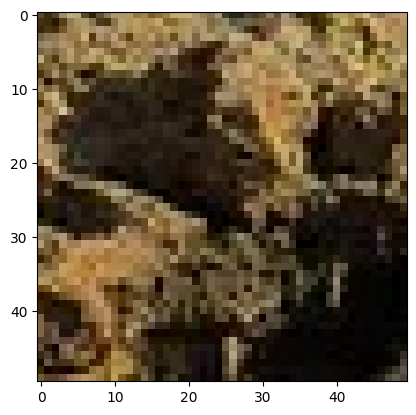

In [54]:
# Tomamos una muestra de la tierra o playa rocosa
img_muestra = img3[430:480,230:280,:]
plt.figure(2)
plt.imshow(img_muestra)
plt.show()

Sigo la metodología estadística discutida en clase, dada la muestra de la playa rocosa, calculamos la media y desviación estándar

In [55]:
# Calculamos un modelo estadístico sencillo para caracterizar el color de la playa en el espacio RGB
color_mean, color_std = cv.meanStdDev(img_muestra)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

[84.38680000000001, 67.0528, 41.5784, 255.0]
[58.94487921575545, 50.882763409233185, 36.974475702029906, 0.0]


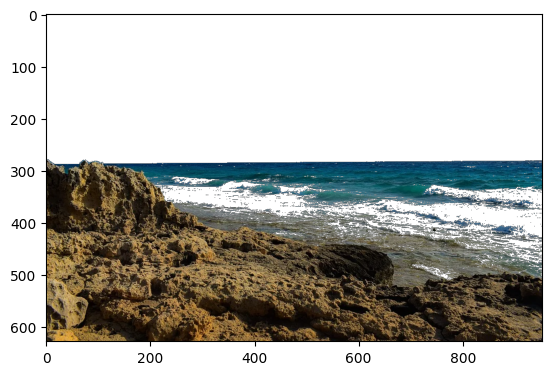

<function matplotlib.pyplot.show(close=None, block=None)>

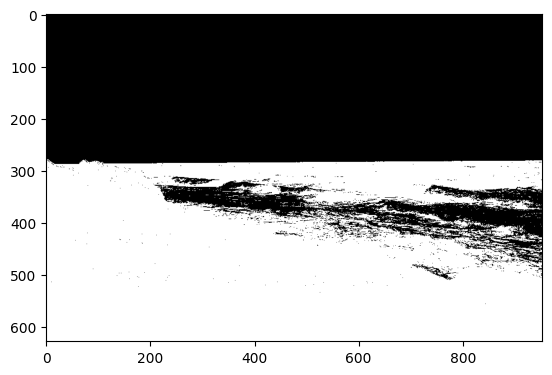

In [59]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 3 sigmas
# para ¨capturar¨ el 99.7 % de pixeles.
n_sigma = 3
mask = cv.inRange(img3, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(img3, img3, mask=mask)

plt.figure(3)
plt.imshow(img_segmentada)
plt.show()

plt.figure(4)
plt.imshow(mask,cmap='gray')
plt.show

Usando 3σ me segmentó no solo la tierra sino parte del agua que estaba más oscura. Modifico para que tome pixeles más parecidos a la muestra de la tierra y haya menos varianza.

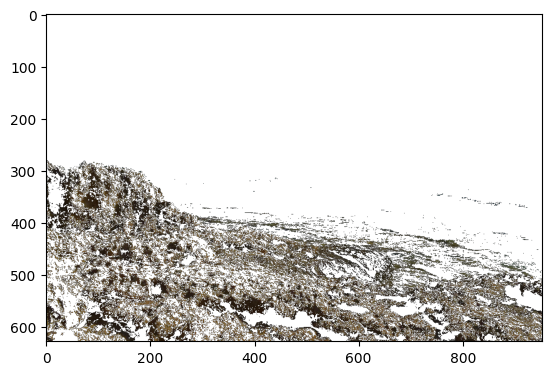

<function matplotlib.pyplot.show(close=None, block=None)>

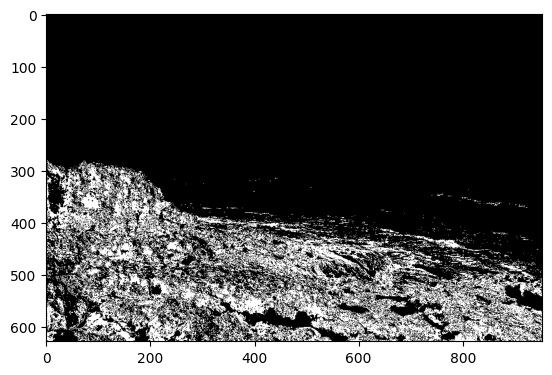

In [60]:
n_sigma = 1
mask = cv.inRange(img3, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(img3, img3, mask=mask)

plt.figure(3)
plt.imshow(img_segmentada)
plt.show()

plt.figure(4)
plt.imshow(mask,cmap='gray')
plt.show